# BABACHI

In [1]:
#importing modules
import sys
import numpy as np
import pandas as pd
from io import open
from IPython.display import Image, display
import time
import os
!{sys.executable} -m pip install -q babachi==1.5.6
from babachi import BADEstimation
from babachi.visualize_segmentation import init_from_snps_collection

In [2]:
# Datasets paths
data_dir = './data'
badmaps_dir = './badmaps'
cosmic_file_path = os.path.join('./utils', 'COSMIC_copy_number.sorted.tsv')
data = sorted(os.listdir(data_dir))
data

['22RV1__prostate_carcinoma_@_labs_michael-snyder___biosamples_ENCBS822DIG_.tsv',
 'A549__lung_carcinoma_@_labs_michael-snyder___biosamples_ENCBS611JSC_.tsv',
 'HCT-116__colon_carcinoma_@_labs_michael-snyder___biosamples_ENCBS615KTO_.tsv',
 'HCT-116__colon_carcinoma_@_labs_michael-snyder___biosamples_ENCBS626JHZ_.tsv',
 'K562__myelogenous_leukemia_@_labs_michael-snyder___biosamples_ENCBS101QRF_.tsv',
 'K562__myelogenous_leukemia_@_labs_michael-snyder___biosamples_ENCBS384AAA_.tsv',
 'K562__myelogenous_leukemia_@_labs_michael-snyder___biosamples_ENCBS725WFV_.tsv',
 'SK-N-SH__neuroblastoma_@_labs_bradley-bernstein___biosamples_ENCBS500EWH_.tsv']

## Function to start segmentation
You can provide all the options from command line but for the sake of convenience we will work with babachi as a python module <br>
Source code is available on github
https://github.com/autosome-ru/BABACHI

In [3]:
!babachi -h

Usage:
    babachi <file> [-O <path> |--output <path>] [-q | --quiet] [--allele-reads-tr <int>] [--force-sort] [--visualize] [-B <float> |--boundary-penalty <float>] [--states <string>] [-Z <int> |--min-seg-snps <int>] [-R <int> |--min-seg-bp <int>] [-P <int> |--post-segment-filter <int>] [-A <int> |--atomic-region-size <int>] [-C <int> |--chr-min-snps <int>] [-S <int> |--subchr-filter <int>]
    babachi (--test) [-O <path> |--output <path>] [-q | --quiet] [--allele-reads-tr <int>] [--force-sort] [--visualize] [-B <float> |--boundary-penalty <float>] [--states <string>] [-Z <int> |--min-seg-snps <int>] [-R <int> |--min-seg-bp <int>] [-P <int> |--post-segment-filter <int>] [-A <int> |--atomic-region-size <int>] [-C <int> |--chr-min-snps <int>] [-S <int> |--subchr-filter <int>]    babachi visualize <file> (-b <badmap>| --badmap <badmap>) [-q | --quiet] [--allele-reads-tr <int>]
    babachi -h | --help

Arguments:
    <file>            Path to input file in tsv format with columns:
      

In [4]:
def segmentation_start(dataset_name, chromosomes, states=[1, 2, 3, 4, 5, 6], prior=None, min_seg_snps=3,
                       min_seg_bp=1000, atomic_region_size=600, verbose=True):
    """
    dataset_name: String. Name of the dataset in ./data directory
    chromosomes: List of chromosomes
    states: List of allowed states
    prior: Dictionary, where keys are the states and values are the prior probabilities of states
    min_seg_snps: Integer. Only allow segments containing Z or more unique SNPs (IDs/positions)
    min_seg_bp: Integer. Only allow segments containing R or more base pairs
    atomic_region_size: Integer. Atomic region size in SNPs
    verbose: Boolean. Write segmentation log
    """
    with open(os.path.join(data_dir, dataset_name), 'r') as dt:
        snps_collection, _, _ = BADEstimation.parse_input_file(dt)
        basename = os.path.splitext(os.path.basename(dataset_name))[0]
        badmap_file_path = os.path.join(badmaps_dir, basename + '.bed')
    if 'K562' in dataset_name:
        cosmic_line = 'K-562'
    elif 'HCT-116' in dataset_name:
        cosmic_line = 'HCT-116'
    elif 'SK-N-SH' in dataset_name:
        cosmic_line = 'SK-N-SH'
    elif 'A549' in dataset_name:
        cosmic_line = 'A549'
    elif '22RV1' in dataset_name:
        cosmic_line = '22RV1'
    else:
        raise ValueError('Unknown cell line {}'.format(dataset_name))

    #create GenomeSegmentator class (main class of segmentation)
    GS = BADEstimation.GenomeSegmentator(
        snps_collection=snps_collection,
        chromosomes_order=chromosomes,
        out=badmap_file_path,
        states=states,
        prior=prior,
        atomic_region_size=atomic_region_size,
        min_seg_snps=min_seg_snps,
        min_seg_bp=min_seg_bp,
        verbose=verbose
    )
    
    
    GS.estimate_BAD()


    #visualizing part
    #remove cosmic_line or cosmic file from params to remove comparison with cosmic
    if os.path.exists(badmap_file_path):
        init_from_snps_collection(snps_collection, BAD_file=badmap_file_path, verbose=False,
                                  img_format='png', cosmic_line=cosmic_line, cosmic_file=cosmic_file_path)
        for chromosome in chromosomes:
            display(Image(os.path.join(badmaps_dir, '{}_visualization'.format(basename),
                                            '{}_{}.png'.format(basename, chromosome))))
        return badmap_file_path
    else:
        print('Not enough SNVs to start segmentation')
        return ''

## Segmentation example

K562__myelogenous_leukemia_@_labs_michael-snyder___biosamples_ENCBS725WFV_.tsv
chr6 total SNP count: 16352


Processing SNPs in chr6
Stage 1 subchromosomes (start SNP index, end SNP index): [(0, 16352)]
Constructing initial SNP-wise likelihoods...
Segmenting atomic regions:
Making 1 out of 53 atomic regions from SNP 0 to 603 for chr6 (subchromosome 1 of 1).
Making 2 out of 53 atomic regions from SNP 303 to 906 for chr6 (subchromosome 1 of 1).
Making 3 out of 53 atomic regions from SNP 606 to 1209 for chr6 (subchromosome 1 of 1).
Making 4 out of 53 atomic regions from SNP 909 to 1512 for chr6 (subchromosome 1 of 1).
Making 5 out of 53 atomic regions from SNP 1212 to 1815 for chr6 (subchromosome 1 of 1).
Making 6 out of 53 atomic regions from SNP 1515 to 2118 for chr6 (subchromosome 1 of 1).
Making 7 out of 53 atomic regions from SNP 1818 to 2421 for chr6 (subchromosome 1 of 1).
Making 8 out of 53 atomic regions from SNP 2121 to 2724 for chr6 (subchromosome 1 of 1).
Making 9 out of 53 at

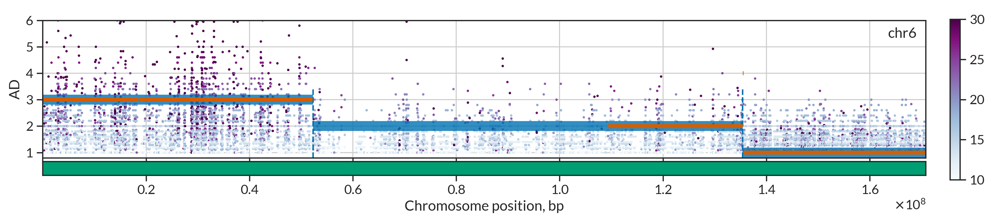

In [5]:
# K562 cells labs_michael-snyder biosamples ENCBS725WFV
dataset_path = 'K562__myelogenous_leukemia_@_labs_michael-snyder___biosamples_ENCBS725WFV_.tsv'
print(dataset_path)
chromosomes = ['chr6']
states = [1, 2, 3, 4, 5, 6,]
badmap_file_path = segmentation_start(dataset_path, chromosomes, states, min_seg_bp=1000, min_seg_snps=3)


## Output format

In [6]:
bad_df = pd.read_table(badmap_file_path)
bad_df

,#chr,start,end,BAD,SNP_count,SNP_ID_count,sum_cover,Q1.00,Q2.00,Q3.00,Q4.00,Q5.00,Q6.00
0,chr6,1,52318783,3,4959,4959,92986,-4682.807146,-682.699543,0.00000,-323.230096,-908.112171,-1549.758872
1,chr6,52318783,135410571,2,4249,4249,60283,-477.897849,0.000000,-262.44065,-713.895317,-1176.150385,-1609.609150
2,chr6,135410571,170805980,1,7144,7144,105818,0.000000,-697.847220,-2434.73280,-4189.726250,-5768.494641,-7165.858800


In [7]:
def average(row):
    bad_array, weights_array = zip(*((float(BAD_str[1:]), 1 / (abs(likelihood) + 1)) 
                                     for BAD_str, likelihood in row.to_dict().items() if BAD_str.startswith('Q')))

    return np.average(bad_array, weights=weights_array)
bad_df['new BAD'] = bad_df.apply(average, axis=1)
bad_df[['#chr', 'start', 'end', 'BAD', 'new BAD']]

,#chr,start,end,BAD,new BAD
0,chr6,1,52318783,3,3.005295
1,chr6,52318783,135410571,2,2.009455
2,chr6,135410571,170805980,1,1.004348


## Another cell line

chr17 total SNP count: 19273


Processing SNPs in chr17
Stage 1 subchromosomes (start SNP index, end SNP index): [(0, 5304), (5304, 19273)]
Constructing initial SNP-wise likelihoods...
Segmenting atomic regions:
Making 1 out of 16 atomic regions from SNP 0 to 613 for chr17 (subchromosome 1 of 2).
Making 2 out of 16 atomic regions from SNP 313 to 926 for chr17 (subchromosome 1 of 2).
Making 3 out of 16 atomic regions from SNP 626 to 1239 for chr17 (subchromosome 1 of 2).
Making 4 out of 16 atomic regions from SNP 939 to 1552 for chr17 (subchromosome 1 of 2).
Making 5 out of 16 atomic regions from SNP 1252 to 1865 for chr17 (subchromosome 1 of 2).
Making 6 out of 16 atomic regions from SNP 1565 to 2178 for chr17 (subchromosome 1 of 2).
Making 7 out of 16 atomic regions from SNP 1878 to 2491 for chr17 (subchromosome 1 of 2).
Making 8 out of 16 atomic regions from SNP 2191 to 2804 for chr17 (subchromosome 1 of 2).
Making 9 out of 16 atomic regions from SNP 2504 to 3117 for chr17 (subchromo

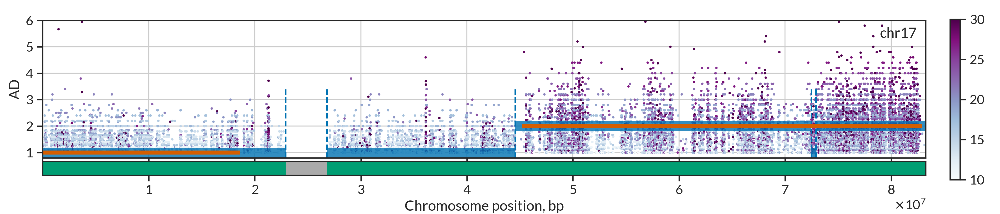

'./badmaps\\HCT-116__colon_carcinoma_@_labs_michael-snyder___biosamples_ENCBS615KTO_.bed'

In [8]:
# HCT-116 cells labs_michael-snyder biosamples ENCBS615KTO
dataset_path = 'HCT-116__colon_carcinoma_@_labs_michael-snyder___biosamples_ENCBS615KTO_.tsv'
chromosomes = ['chr17']

states = [1, 2, 3, 4, 5, 6]

segmentation_start(dataset_path, chromosomes, states)

## Deletions where cosmic data is available

chr11 total SNP count: 2308


Processing SNPs in chr11
Stage 1 subchromosomes (start SNP index, end SNP index): [(0, 851), (851, 1002), (1002, 2308)]
Constructing initial SNP-wise likelihoods...
Segmenting atomic regions:
Making 1 out of 1 atomic region from SNP 0 to 850 for chr11 (subchromosome 1 of 3).
Unique SNPs positions in subchromosome 1: 851
Constructing initial SNP-wise likelihoods...
Segmenting atomic regions:
Making 1 out of 1 atomic region from SNP 0 to 150 for chr11 (subchromosome 2 of 3).
Unique SNPs positions in subchromosome 2: 151
Constructing initial SNP-wise likelihoods...
Segmenting atomic regions:
Making 1 out of 3 atomic regions from SNP 0 to 635 for chr11 (subchromosome 3 of 3).
Making 2 out of 3 atomic regions from SNP 335 to 970 for chr11 (subchromosome 3 of 3).
Making 3 out of 3 atomic regions from SNP 670 to 1305 for chr11 (subchromosome 3 of 3).
Unique SNPs positions in subchromosome 3: 1306

Estimated BADs: [2.00, 2.00, 2.00]
SNP counts: [851, 151, 1306]
SN

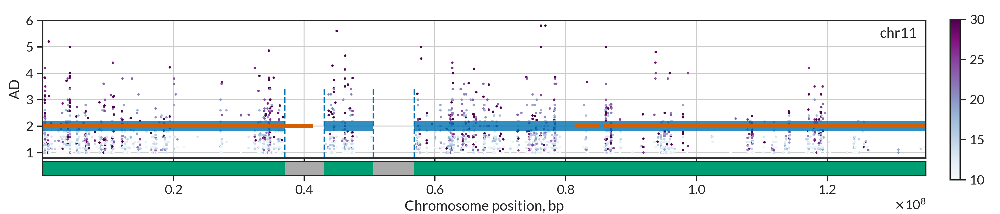

'./badmaps\\K562__myelogenous_leukemia_@_labs_michael-snyder___biosamples_ENCBS384AAA_.bed'

In [9]:
# K562 cells labs_michael-snyder biosamples ENCBS384AAA
dataset_path = 'K562__myelogenous_leukemia_@_labs_michael-snyder___biosamples_ENCBS384AAA_.tsv'
chromosomes = ['chr11']

states = [1, 2, 3, 4, 5, 6]
prior = {
    1: 1,
    2: 1,
    3: 1,
    4: 1,
    5: 1,
    6: 1,
}
segmentation_start(dataset_path, chromosomes, states, prior)

## Atomic region size

K562__myelogenous_leukemia_@_labs_michael-snyder___biosamples_ENCBS725WFV_.tsv
Processing SNPs in chr6


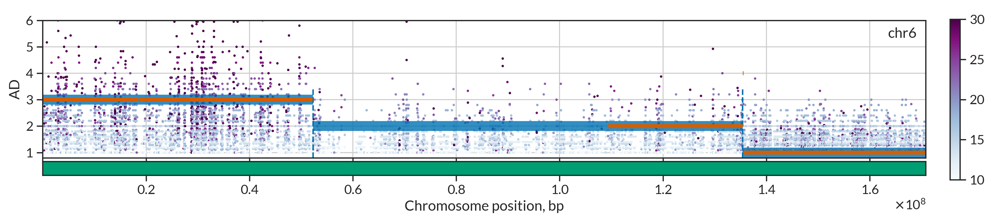

Processing SNPs in chr6


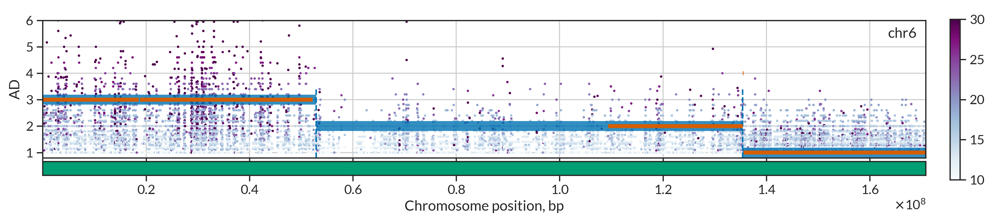

Processing SNPs in chr6


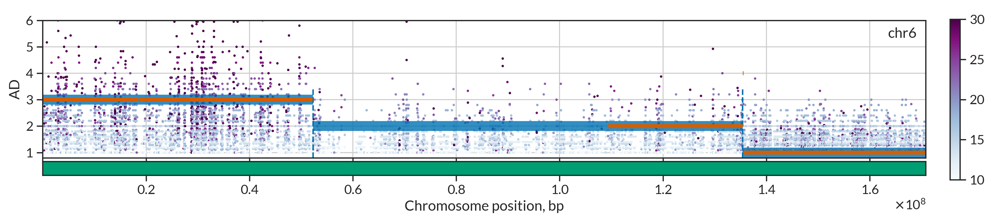

In [10]:
# K562 cells labs_michael-snyder biosamples ENCBS725WFV
dataset_path = 'K562__myelogenous_leukemia_@_labs_michael-snyder___biosamples_ENCBS725WFV_.tsv'
print(dataset_path)
chromosomes = ['chr6']
states = [1, 2, 3, 4, 5, 6,]
badmap_file_path = segmentation_start(dataset_path, chromosomes, states, min_seg_bp=1000, 
                                      min_seg_snps=3, atomic_region_size=600, verbose=False) #10.8s
badmap_file_path = segmentation_start(dataset_path, chromosomes, states, min_seg_bp=1000, 
                                      min_seg_snps=3, atomic_region_size=100, verbose=False) #19.9s
badmap_file_path = segmentation_start(dataset_path, chromosomes, states, min_seg_bp=1000, 
                                      min_seg_snps=3, atomic_region_size=2000, verbose=False) #22.6s
# badmap_file_path = segmentation_start(dataset_path, chromosomes, states, min_seg_bp=1000, 
#                                       min_seg_snps=3, atomic_region_size=10, verbose=False) #147.6s


## Mostly diploid cell lines

SK-N-SH__neuroblastoma_@_labs_bradley-bernstein___biosamples_ENCBS500EWH_.tsv
Processing SNPs in chr10
Processing SNPs in chr11
Processing SNPs in chr12
Processing SNPs in chr13
Processing SNPs in chr14
Processing SNPs in chr15
Processing SNPs in chr16
Processing SNPs in chr17
Processing SNPs in chr18
Processing SNPs in chr19
Processing SNPs in chr20
Processing SNPs in chr21
Processing SNPs in chr22


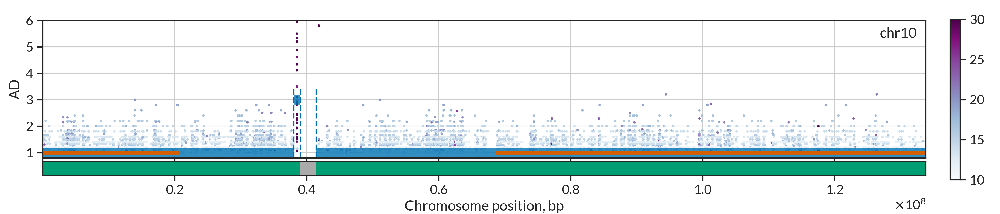

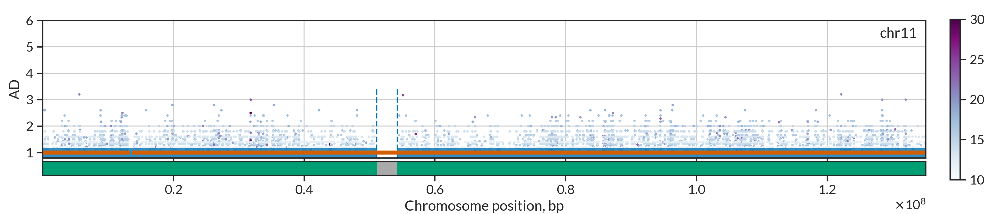

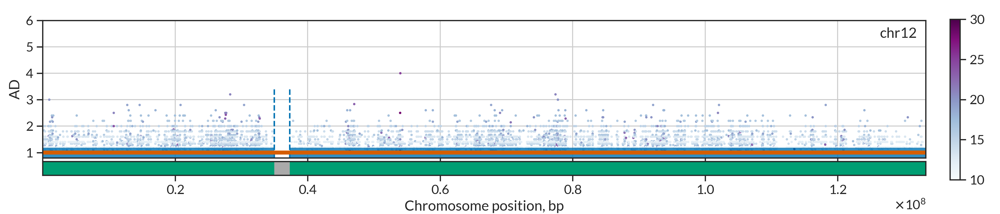

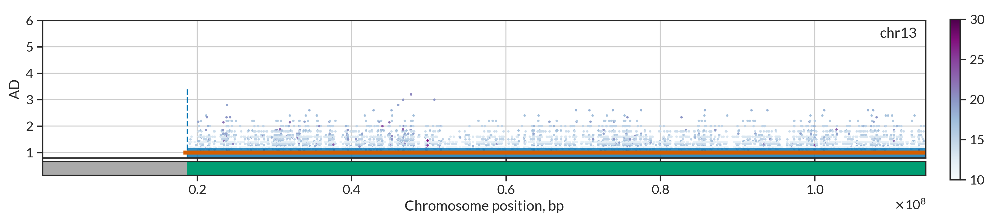

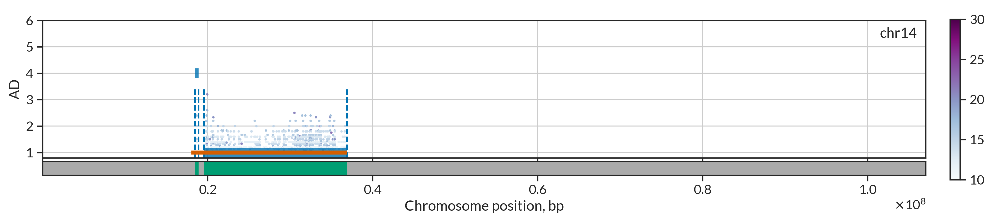

...

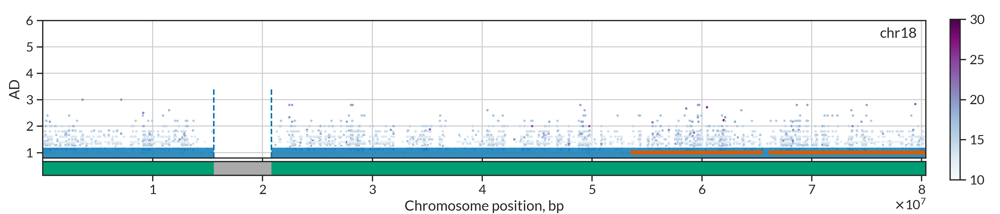

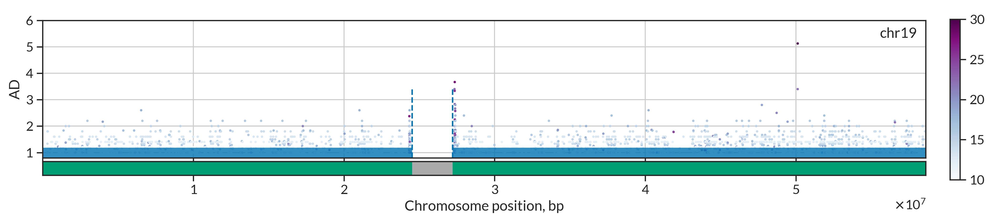

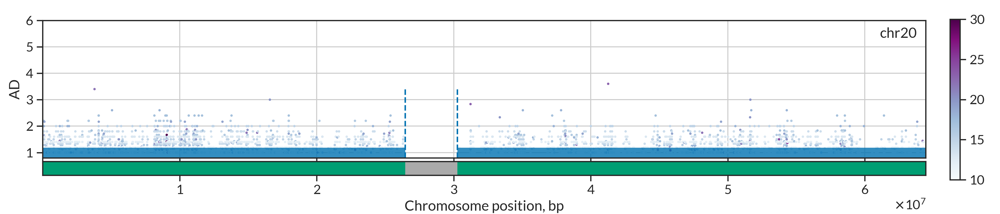

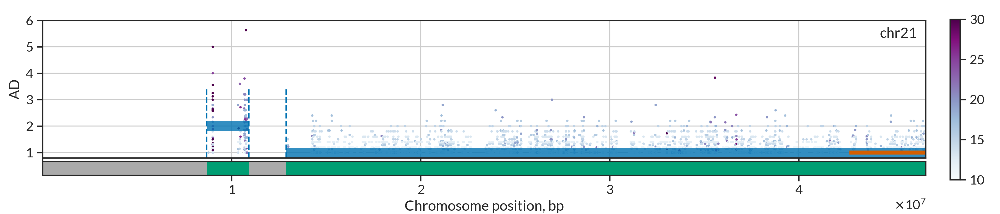

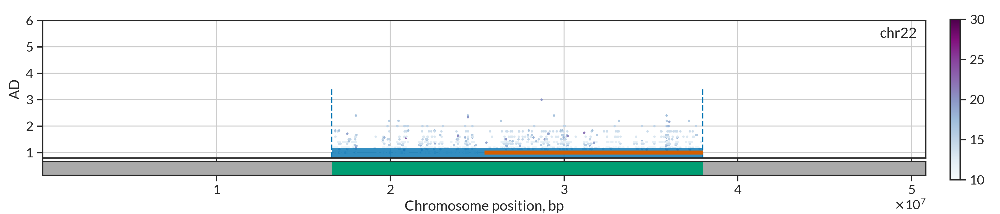

'./badmaps\\SK-N-SH__neuroblastoma_@_labs_bradley-bernstein___biosamples_ENCBS500EWH_.bed'

In [11]:
# SK-N-SH
dataset_path = data[7]
print(dataset_path)
chromosomes = ['chr{}'.format(i) for i in range(10, 23)]
states = [1, 2, 3, 4, 5, 6]

segmentation_start(dataset_path, chromosomes, states, verbose=False)

HCT-116__colon_carcinoma_@_labs_michael-snyder___biosamples_ENCBS626JHZ_.tsv
Processing SNPs in chr10
Processing SNPs in chr11
Processing SNPs in chr12
Processing SNPs in chr13
Processing SNPs in chr14
Processing SNPs in chr15


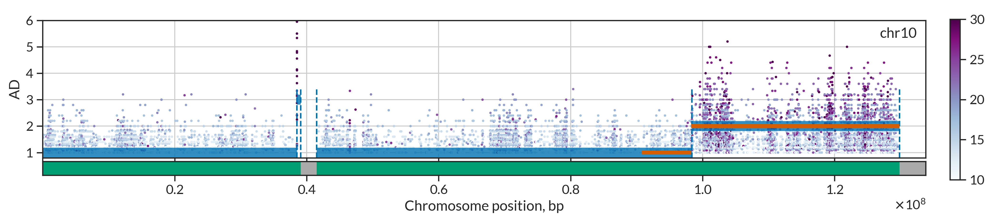

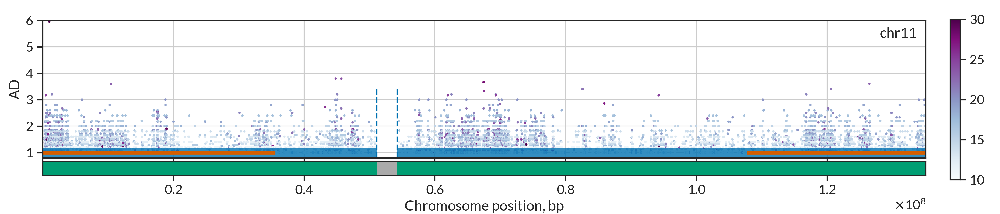

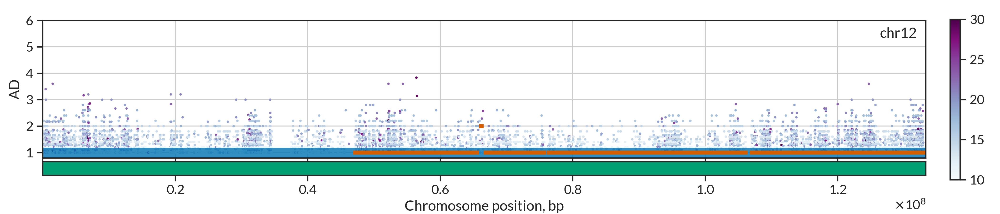

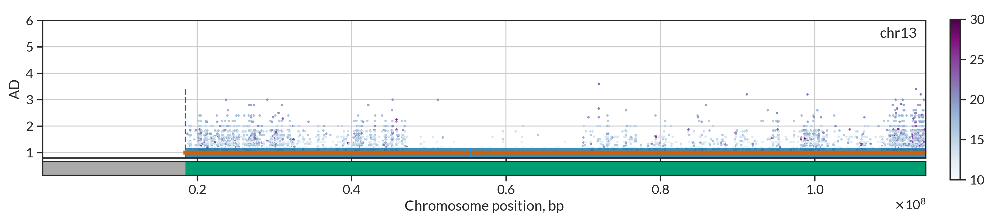

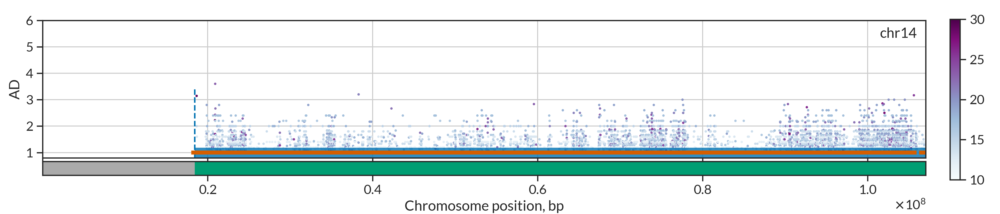

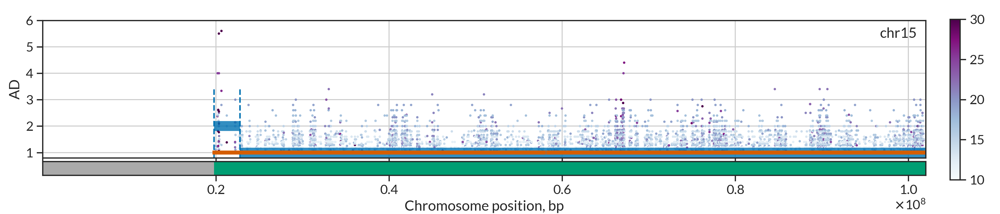

'./badmaps\\HCT-116__colon_carcinoma_@_labs_michael-snyder___biosamples_ENCBS626JHZ_.bed'

In [12]:
# HCT116
dataset_path = data[3]
print(dataset_path)
chromosomes = ['chr{}'.format(i) for i in range(10, 16)]
states = [1, 2, 3, 4, 5, 6]

segmentation_start(dataset_path, chromosomes, states, verbose=False)

## How does the states set affect the result

Processing SNPs in chr10


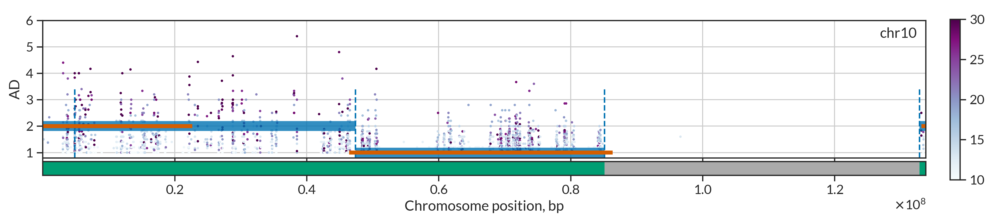

Processing SNPs in chr10


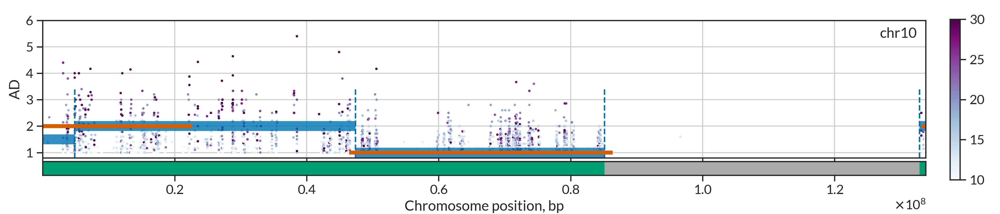

'./badmaps\\K562__myelogenous_leukemia_@_labs_michael-snyder___biosamples_ENCBS384AAA_.bed'

In [13]:
dataset_path = 'K562__myelogenous_leukemia_@_labs_michael-snyder___biosamples_ENCBS384AAA_.tsv'
chromosomes = ['chr10']


states = [1, 2, 3, 4, 5, 6]

segmentation_start(dataset_path, chromosomes, states, verbose=False)

states = [1, 2, 3, 4, 5, 6, 4 / 3, 1.5, 2.5]

segmentation_start(dataset_path, chromosomes, states, verbose=False)


SK-N-SH__neuroblastoma_@_labs_bradley-bernstein___biosamples_ENCBS500EWH_.tsv
Processing SNPs in chr18


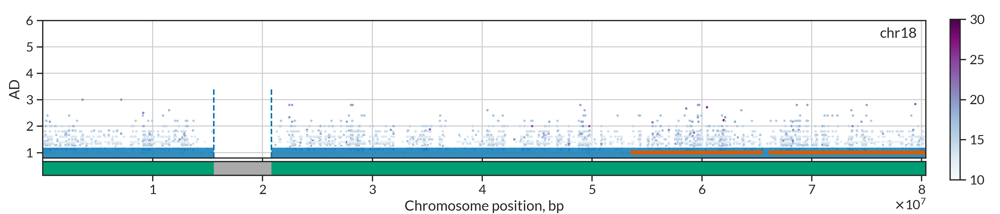

Processing SNPs in chr18


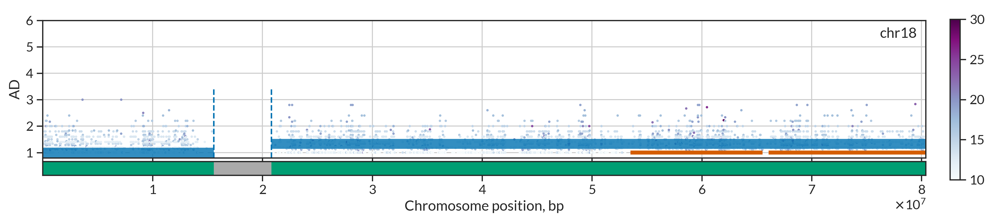

'./badmaps\\SK-N-SH__neuroblastoma_@_labs_bradley-bernstein___biosamples_ENCBS500EWH_.bed'

In [14]:
# SK-N-SH
dataset_path = data[7]
print(dataset_path)
chromosomes = ['chr18']
states = [1, 2, 3, 4, 5, 6]

segmentation_start(dataset_path, chromosomes, states, verbose=False)

chromosomes = ['chr18']
states = [1, 2, 3, 4, 5, 6, 1.5, 2.5, 4/3]
segmentation_start(dataset_path, chromosomes, states, verbose=False)

## Can we achieve better results using prior

SK-N-SH__neuroblastoma_@_labs_bradley-bernstein___biosamples_ENCBS500EWH_.tsv
Processing SNPs in chr18


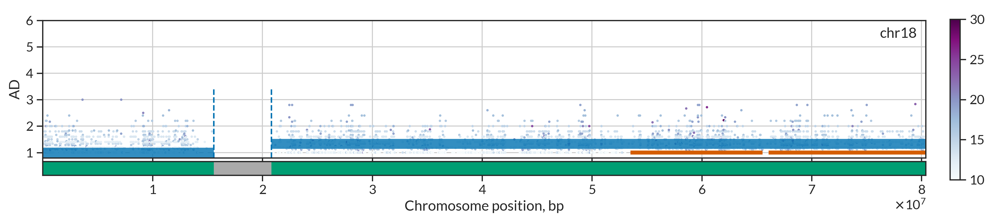

Processing SNPs in chr18


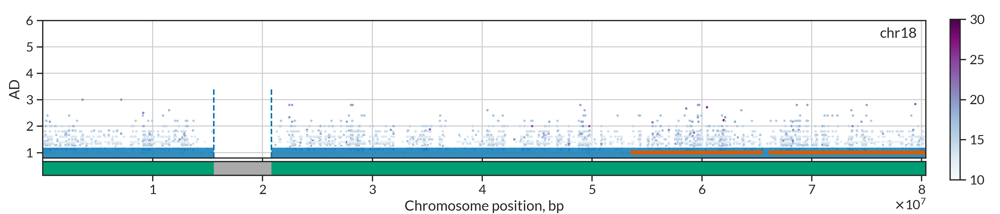

'./badmaps\\SK-N-SH__neuroblastoma_@_labs_bradley-bernstein___biosamples_ENCBS500EWH_.bed'

In [15]:
# SK-N-SH
dataset_path = data[7]
print(dataset_path)

chromosomes = ['chr18']
states = [1, 2, 3, 4, 5, 6, 1.5, 2.5, 4/3]
segmentation_start(dataset_path, chromosomes, states, verbose=False)

chromosomes = ['chr18']
states = [1, 2, 3, 4, 5, 6, 1.5, 2.5, 4/3]
prior = {
    1: 1,
    2: 1,
    3: 1,
    4: 1,
    5: 1,
    6: 1,
    4/3: 0.1,
    1.5: 0.1,
    2.5: 0.1,
}
segmentation_start(dataset_path, chromosomes, states, prior=prior, verbose=False)

Processing SNPs in chr10


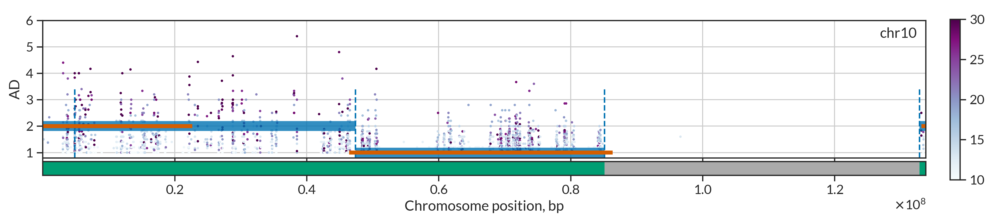

Processing SNPs in chr10


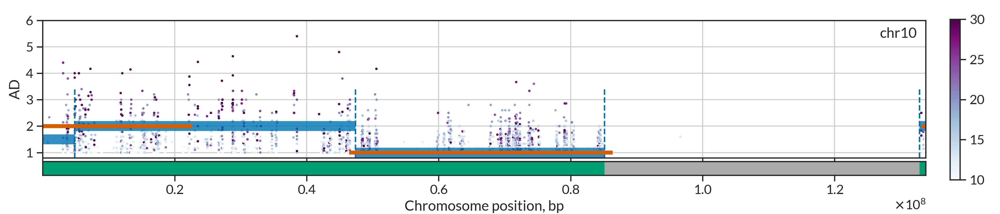

Processing SNPs in chr10


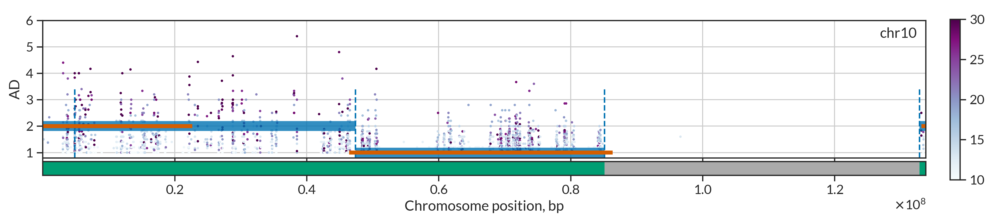

'./badmaps\\K562__myelogenous_leukemia_@_labs_michael-snyder___biosamples_ENCBS384AAA_.bed'

In [16]:
# K562 cells labs_michael-snyder biosamples ENCBS384AAA
dataset_path = 'K562__myelogenous_leukemia_@_labs_michael-snyder___biosamples_ENCBS384AAA_.tsv'
chromosomes = ['chr10']
states = [1, 2, 3, 4, 5, 6]

prior = {
    1: 1,
    2: 1,
    3: 1,
    4: 1,
    5: 1,
    6: 1,
}
segmentation_start(dataset_path, chromosomes, states, prior, verbose=False)
states = [1, 2, 3, 4, 5, 6, 4/3, 1.5, 2.5]
prior = {
    1: 1,
    2: 1,
    3: 1,
    4: 1,
    5: 1,
    6: 1,
    4/3: 1,
    1.5: 1,
    2.5: 1,
}
segmentation_start(dataset_path, chromosomes, states, prior, verbose=False)

prior = {
    1: 1,
    2: 1,
    3: 1,
    4: 1,
    5: 1,
    6: 1,
    4/3: 1,
    1.5: 0.5,
    2.5: 1,
}
segmentation_start(dataset_path, chromosomes, states, prior, verbose=False)

## It doesn't always help ...

A549__lung_carcinoma_@_labs_michael-snyder___biosamples_ENCBS611JSC_.tsv
Processing SNPs in chr19


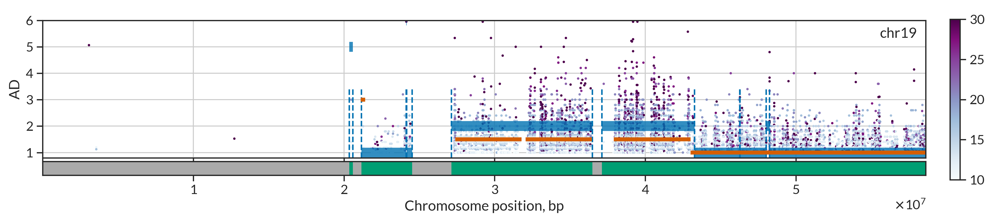

Processing SNPs in chr19


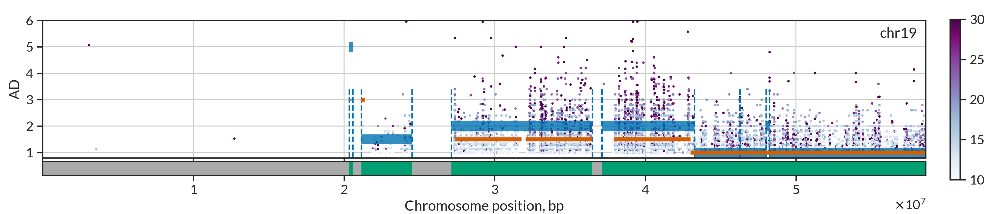

Processing SNPs in chr19


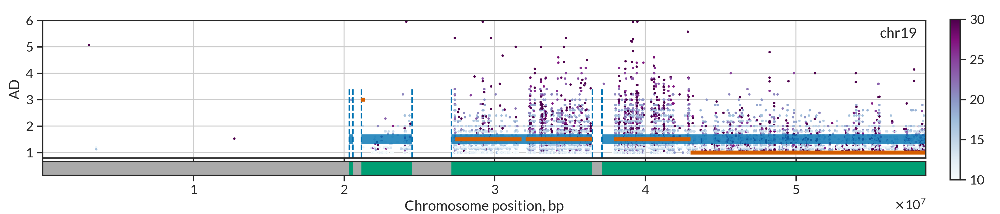

'./badmaps\\A549__lung_carcinoma_@_labs_michael-snyder___biosamples_ENCBS611JSC_.bed'

In [17]:
dataset_path = data[1]
chromosomes = ['chr19']
print(dataset_path)
states = [1, 2, 3, 4, 5, 6]

segmentation_start(dataset_path, chromosomes, states, verbose=False)

states = [1, 2, 3, 4, 5, 6, 1.5]

segmentation_start(dataset_path, chromosomes, states, verbose=False)

prior = {
    1: 1,
    2: 1,
    3: 1,
    4: 1,
    5: 1,
    6: 1,
    1.5: 2
}

segmentation_start(dataset_path, chromosomes, states, prior=prior, verbose=False)



## Segmentation resolution control

Processing SNPs in chr7


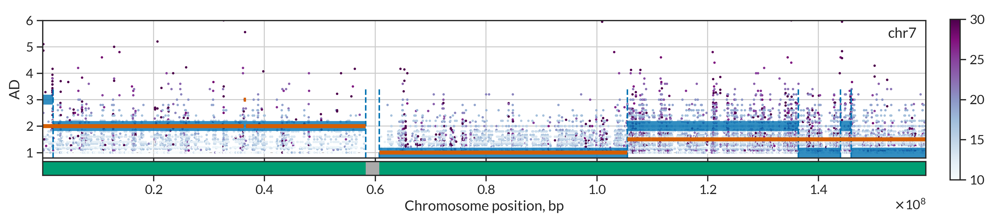

Processing SNPs in chr7


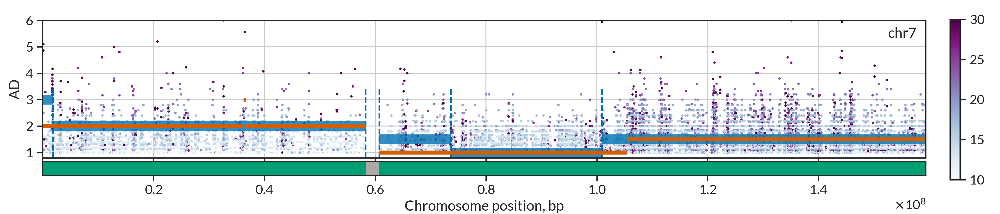

Processing SNPs in chr7


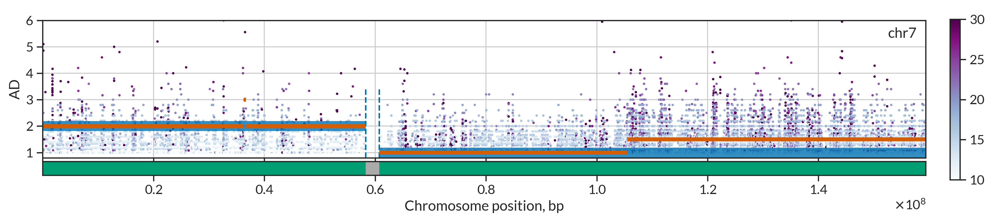

'./badmaps\\K562__myelogenous_leukemia_@_labs_michael-snyder___biosamples_ENCBS725WFV_.bed'

In [18]:
# K562 cells labs_michael-snyder biosamples ENCBS725WFV
dataset_path = 'K562__myelogenous_leukemia_@_labs_michael-snyder___biosamples_ENCBS725WFV_.tsv'
chromosomes = ['chr7']

states = [1, 2, 3, 4, 5, 6]

segmentation_start(dataset_path, chromosomes, states, verbose=False)

states = [1, 2, 3, 4, 5, 6, 1.5]

segmentation_start(dataset_path, chromosomes, states, verbose=False)

states = [1, 2, 3, 4, 5, 6, 1.5]
prior = {
    1: 1,
    2: 1,
    3: 1,
    4: 1,
    5: 1,
    6: 1,
    1.5: 0.9
}


segmentation_start(dataset_path, chromosomes, states, min_seg_bp=10**7, prior=prior, verbose=False)


<h2 class="code-line" data-line-start=0 data-line-end=1 ><a id="Things_to_take_away_0"></a>Things to take away</h2>
<ol>
<li class="has-line-data" data-line-start="1" data-line-end="4">When to use BABACHI:
<ul>
<li class="has-line-data" data-line-start="2" data-line-end="3">You want to call allele-specific binding, allele-specific chromatin accesibility, etc, but you don’t have CNV/WGS data.</li>
<li class="has-line-data" data-line-start="3" data-line-end="4">See <a href="https://www.nature.com/articles/s41467-021-23007-0">ADASTRA</a>.</li>
</ul>
</li>
<li class="has-line-data" data-line-start="4" data-line-end="9">How to choose parameters:
<ul>
<li class="has-line-data" data-line-start="5" data-line-end="6">Introducing non-integer allowed BAD states may reduce the recall of diploids.</li>
<li class="has-line-data" data-line-start="6" data-line-end="7">Prior may help in specific situations but should be used with care.</li>
<li class="has-line-data" data-line-start="7" data-line-end="8">Segmentation resolution can be controlled with <code>--min-seg-bp | -R</code> and <code>--min-seg-snps | -Z</code> parameters.</li>
<li class="has-line-data" data-line-start="8" data-line-end="9">For other parameters see <code>babachi -h</code> or you can leave them with default values.</li>
</ul>
</li>
<li class="has-line-data" data-line-start="9" data-line-end="11">Post processing
<ul>
<li class="has-line-data" data-line-start="10" data-line-end="11">You can use BABACHI segments and likelihoods as input for any alghorithm to infer BAD.</li>
</ul>
</li>
</ol>

### For any BAD questions or suggestions, write to abramov.sa@phystech.edu Serj Abramov